## Exercice 2 - Comparaison de YOLOv11n et YOLOv11x avec Weights & Biases

L'objectif de ce TP est d'entraîner et comparer deux variantes de YOLOv11 (YOLOv11n et YOLOv11x) sur le dataset **PlantDoc Dataset** pour la détection d'objets, en utilisant **Weights & Biases** (W&B) pour le suivi des expériences.

1. Installation des dépendances
2. Configuration de Weights & Biases
3. Téléchargement et préparation du dataset
4. Entraînement des modèles en utilisant la puissance du GPU
5. Suivi des expériences avec W&B
6. Inférence sur le dataset de test
7. Analyse des Résultats

### 1- Installation des dépendances

- PyTorch
- Ultralytics (pour pouvoir charger et utiliser YOLO)
- Weights & Biases (wandb)

In [ ]:
pip install roboflow ultralytics opencv-python matplotlib wandb

In [3]:
import wandb
from ultralytics import YOLO
import torch
import os

### 2 - Configuration de Weights & Biases

- Accédez à Weights & Biases : https://wandb.ai/site
- Générez une api_key depuis le site Wandb

In [ ]:
import wandb
wandb.login()

In [5]:
!yolo settings wandb=True

JSONDict("/workspace/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/workspace/cours-industrialisation-modeles-ia/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "9997ac5f769a7493a68a2aaccc653aa5e2e06f471c459e38136a41fb72b2100d",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": true,
  "vscode_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


### 3 - Téléchargement et préparation du dataset

- Générez une `api_key` depuis le site Roboflow
- Accédez au dataset : https://public.roboflow.com/object-detection/plantdoc/1

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="ADD YOUR API KEY")
project = rf.workspace("joseph-nelson").project("plantdoc")
version = project.version(1)
dataset = version.download("yolov11")           

- Modifiez le fichier `data.yaml` en mettant à jour les chemins d'accès vers les données

### 4 - Entraînement des modèles

Nous allons entraîner YOLOv11n et YOLOv11x en utilisant le framework Ultralytics:

**4.1 - Entraînement de YOLOv11n**

In [ ]:
train_data = "/workspace/cours-industrialisation-modeles-ia/PlantDoc-1/data.yaml"

model = YOLO("yolo11n.pt")
model.train(data=train_data, epochs=200, imgsz=416, device='cuda', project="yolo11_plant", name="yolo11n")

In [8]:
with torch.no_grad():
    torch.cuda.empty_cache()

**4.2 - Entraînement de YOLOv11x**

In [ ]:
train_data = "/workspace/cours-industrialisation-modeles-ia/PlantDoc-1/data.yaml"

model = YOLO("yolo11x.pt")
model.train(data=train_data, epochs=50, imgsz=416, device='cuda', project="yolo11_plant", name="yolo11x")

In [10]:
with torch.no_grad():
    torch.cuda.empty_cache()

### 5 - Suivi des expériences avec W&B

### 6 - Inférence sur une nouvelle image

In [11]:
def run_inference_n(img):
    model_n = YOLO("/workspace/cours-industrialisation-modeles-ia/yolo11_plant/yolo11n3/weights/best.pt")
    results_n = model_n(img)
    results_n[0].show()

In [12]:
def run_inference_x(img):
    model_x = YOLO("/workspace/cours-industrialisation-modeles-ia/yolo11_plant/yolo11x3/weights/best.pt")
    results_x = model_x(img)
    results_x[0].show()


YOLO11n:

image 1/1 /workspace/cours-industrialisation-modeles-ia/feuille.jpg: 288x416 1 grape leaf, 59.8ms
Speed: 27.0ms preprocess, 59.8ms inference, 268.3ms postprocess per image at shape (1, 3, 288, 416)


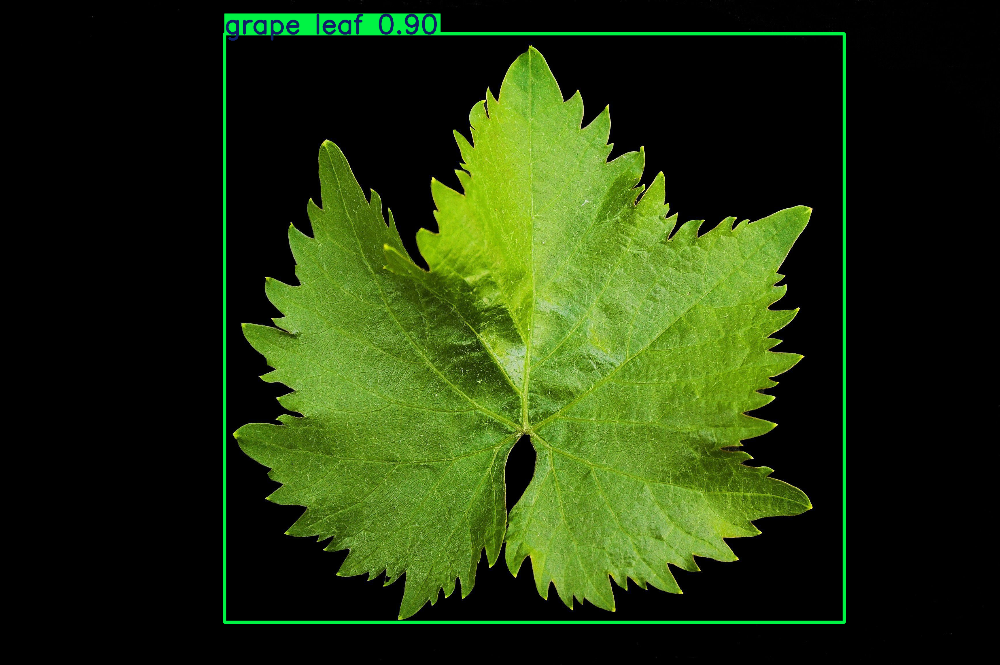

In [13]:
img = "/workspace/cours-industrialisation-modeles-ia/feuille.jpg"

print("\nYOLO11n:")
run_inference_n(img)


YOLO11x:

image 1/1 /workspace/cours-industrialisation-modeles-ia/feuille.jpg: 288x416 1 grape leaf, 45.0ms
Speed: 1.7ms preprocess, 45.0ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 416)


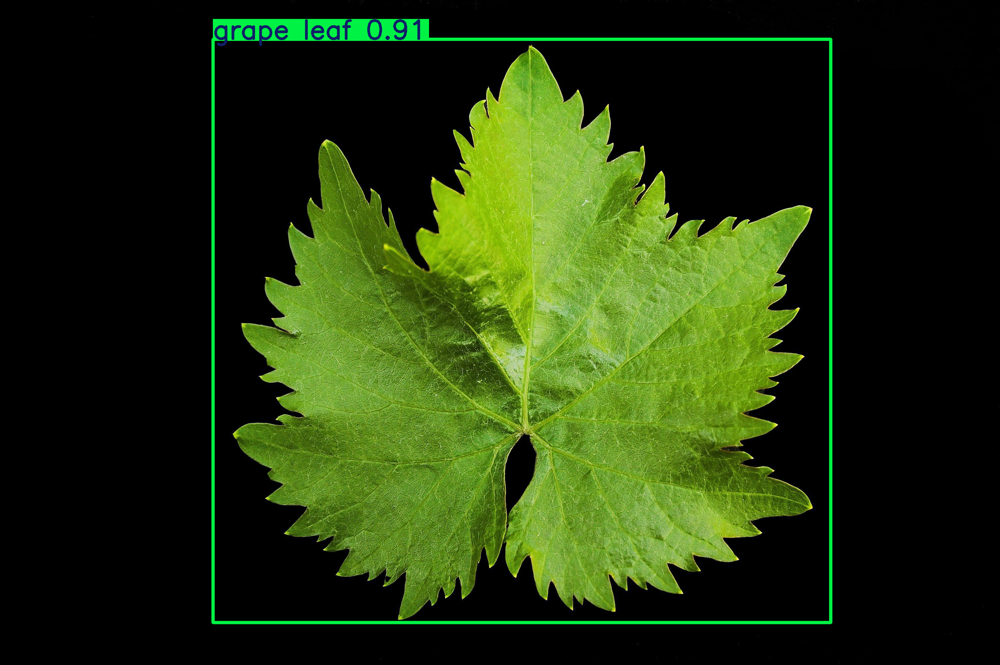

In [14]:
img = "/workspace/cours-industrialisation-modeles-ia/feuille.jpg"

print("\nYOLO11x:")
run_inference_x(img)

### 7 - Analyse des Résultats

- Quel modèle est le plus précis ?
- Quel modèle est le plus rapide ?
- Quel modèle est le plus léger ?

In [ ]:
import matplotlib.pyplot as plt
from glob import glob

# Récupérer les logs d'entraînement
log_files = glob("wandb/latest-run/files/*.log")
for log in log_files:
    print(f"Analyzing {log}")
    with open(log, "r") as f:
        print(f.read())

print("Analyse terminée.")